# Predicting the Price of Airbnb Rentals in NYC

The goal of this notebook is analyze the Airbnb NYC dataset from Kaggle and predict the price of rentals using a variety of regression models.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures

In [2]:
airbnb = pd.read_csv("AB_NYC_2019.csv")

# Section 1: Exploratory Data Analysis

View characteristics of the dataset including data characteristics, summary statistics, and correlation. Replace missing values.

In [3]:
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
airbnb.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [5]:
len(airbnb)

48895

In [6]:
airbnb.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

(array([4.8597e+04, 1.8800e+02, 5.7000e+01, 1.8000e+01, 9.0000e+00,
        8.0000e+00, 7.0000e+00, 3.0000e+00, 2.0000e+00, 6.0000e+00]),
 array([    0.,  1000.,  2000.,  3000.,  4000.,  5000.,  6000.,  7000.,
         8000.,  9000., 10000.]),
 <a list of 10 Patch objects>)

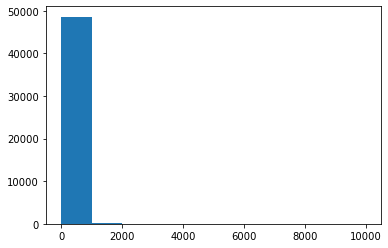

In [7]:
plt.hist(airbnb["price"])

Price is heavily skewed to the left, so it will need to be transformed to fit the model.

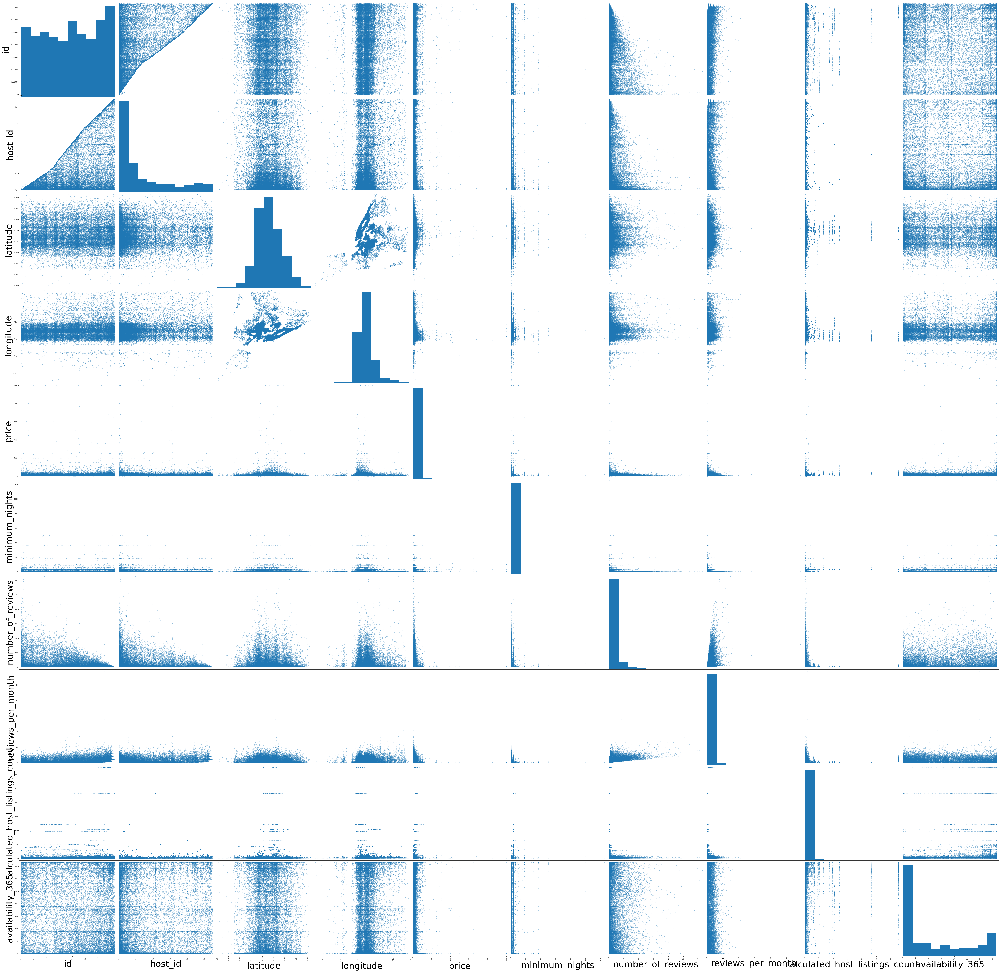

In [8]:
plot = pd.plotting.scatter_matrix(airbnb, figsize= (100,100))
xlabel=[plt.setp(item.yaxis.get_label(), 'size', 50) for item in plot.ravel()]
ylabel = [plt.setp(item.xaxis.get_label(), 'size', 50) for item in plot.ravel()]

In [9]:
airbnb.corr()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1.000000,0.588290,-0.003125,0.090908,0.010619,-0.013224,-0.319760,0.291828,0.133272,0.085468
host_id,0.588290,1.000000,0.020224,0.127055,0.015309,-0.017364,-0.140106,0.296417,0.154950,0.203492
latitude,-0.003125,0.020224,1.000000,0.084788,0.033939,0.024869,-0.015389,-0.010142,0.019517,-0.010983
longitude,0.090908,0.127055,0.084788,1.000000,-0.150019,-0.062747,0.059094,0.145948,-0.114713,0.082731
price,0.010619,0.015309,0.033939,-0.150019,1.000000,0.042799,-0.047954,-0.030608,0.057472,0.081829
minimum_nights,-0.013224,-0.017364,0.024869,-0.062747,0.042799,1.000000,-0.080116,-0.121702,0.127960,0.144303
number_of_reviews,-0.319760,-0.140106,-0.015389,0.059094,-0.047954,-0.080116,1.000000,0.549868,-0.072376,0.172028
reviews_per_month,0.291828,0.296417,-0.010142,0.145948,-0.030608,-0.121702,0.549868,1.000000,-0.009421,0.185791
calculated_host_listings_count,0.133272,0.154950,0.019517,-0.114713,0.057472,0.127960,-0.072376,-0.009421,1.000000,0.225701
availability_365,0.085468,0.203492,-0.010983,0.082731,0.081829,0.144303,0.172028,0.185791,0.225701,1.000000


None of the numerical variables appear to be strongly correlated with the predictor variable, price.

In [10]:
airbnb.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

(array([20104.,     0., 21661.,     0.,     0.,  5666.,     0.,   373.,
            0.,  1091.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <a list of 10 Patch objects>)

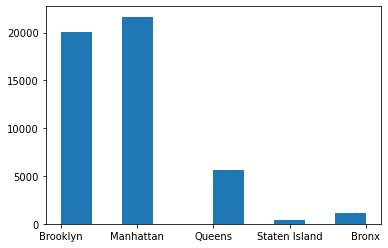

In [11]:
plt.hist(airbnb["neighbourhood_group"])

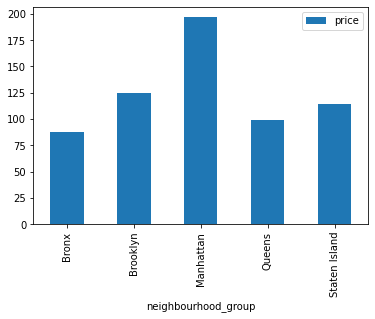

In [12]:
by_neighborhood_group = airbnb.groupby(by="neighbourhood_group").mean()
by_neighborhood_group.plot.bar(y="price")

In [13]:
by_neighborhood = airbnb.groupby(by="neighbourhood").mean()
by_neighborhood_high_price = by_neighborhood[by_neighborhood["price"] >= by_neighborhood["price"].mean()]
by_neighborhood_high_price.sort_values(by="price", ascending=False)

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood,,,,,,,,,,
Fort Wadsworth,2.030516e+07,1.715301e+06,40.595460,-74.060920,800.000000,7.000000,0.000000,NaN,3.000000,365.000000
Woodrow,1.798271e+06,9.430973e+06,40.538840,-74.198260,700.000000,7.000000,0.000000,NaN,1.000000,0.000000
Tribeca,1.969456e+07,5.274450e+07,40.717744,-74.007400,490.638418,11.378531,11.491525,0.834909,42.971751,126.508475
Sea Gate,2.017955e+07,1.168665e+08,40.577119,-74.008720,487.857143,4.142857,1.428571,0.330000,1.857143,65.571429
Riverdale,1.860290e+07,6.890678e+07,40.887352,-73.912064,442.090909,5.363636,26.636364,1.320000,1.545455,160.818182
...,...,...,...,...,...,...,...,...,...,...
Eltingville,1.804075e+07,2.147076e+07,40.541043,-74.154363,141.666667,5.333333,76.000000,2.470000,1.666667,193.000000
Castleton Corners,1.636161e+07,4.202023e+07,40.617103,-74.123007,139.750000,9.000000,25.250000,1.930000,1.000000,188.750000
Windsor Terrace,1.561427e+07,4.072202e+07,40.654612,-73.977990,138.993631,8.713376,27.541401,1.209453,1.541401,81.885350


In [14]:
airbnb.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [7]:
airbnb = airbnb.dropna()

Remove irrelevant fields from the dataset.

In [8]:
airbnb = airbnb.drop(["name", "id", "host_id", "host_name", "last_review"], axis=1)

Convert categorical variables to numerical for the model.

In [9]:
airbnb["neighbourhood_group"]= airbnb["neighbourhood_group"].astype("category").cat.codes
airbnb["neighbourhood"]= airbnb["neighbourhood"].astype("category").cat.codes
airbnb["room_type"]= airbnb["room_type"].astype("category").cat.codes

Transform price to log of price in order to achieve a normal distribution.

In [10]:
airbnb["log_price"] = np.log(airbnb["price"]+1)

(array([1.0000e+01, 0.0000e+00, 1.5000e+01, 1.3720e+03, 1.6474e+04,
        1.7419e+04, 3.0930e+03, 3.8000e+02, 4.3000e+01, 1.5000e+01]),
 array([0.        , 0.92104404, 1.84208807, 2.76313211, 3.68417615,
        4.60522018, 5.52626422, 6.44730826, 7.36835229, 8.28939633,
        9.21044037]),
 <a list of 10 Patch objects>)

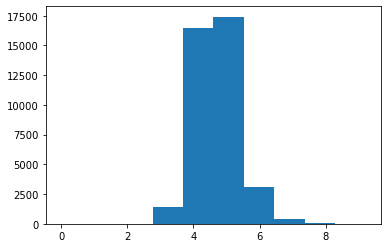

In [20]:
plt.hist(airbnb["log_price"])

In [11]:
airbnb = airbnb.drop(["price"], axis=1)

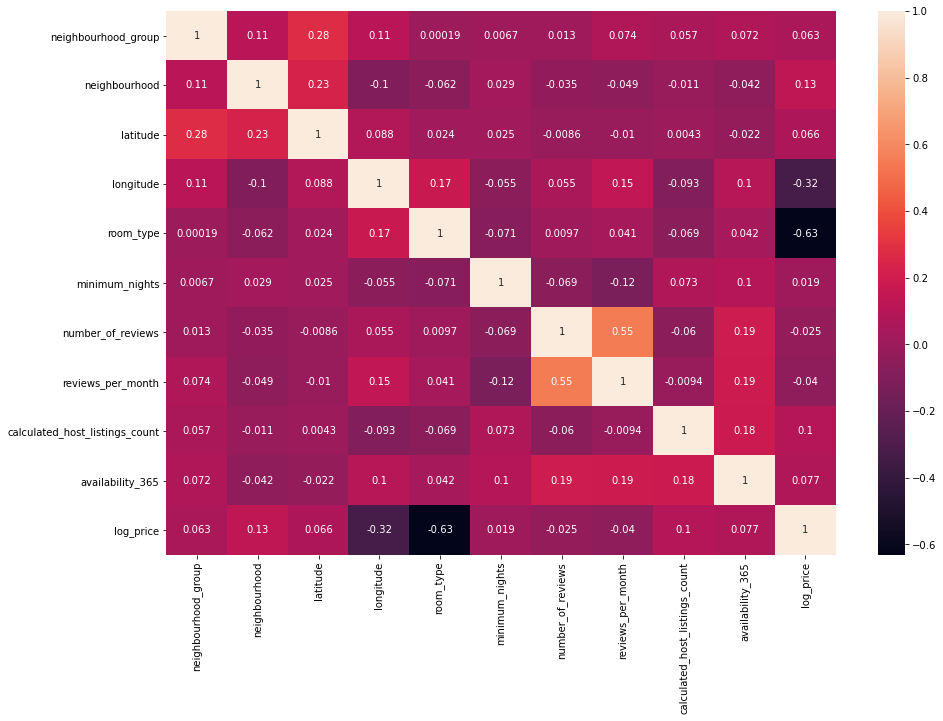

In [22]:
plt.figure(figsize = (15,10))
sns.heatmap(airbnb.corr(), annot = True)

Correlation plot shows that room type and longitude are the most strongly correlated with price.

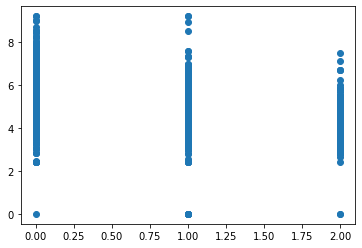

In [12]:
plt.plot(airbnb["room_type"], airbnb["log_price"], "o")

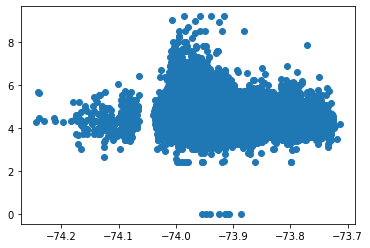

In [25]:
plt.plot(airbnb["longitude"], airbnb["log_price"], "o")

In [14]:
X = airbnb.drop(["log_price"], axis=1)
y = airbnb["log_price"]

Create residual plots to analyze the linearity of the variables compared to log of price. It looks like many of the variables are not linear, which may lead to underfitting in the model.

/Users/alexandraulven/opt/anaconda3/lib/python3.8/site-packages/statsmodels/nonparametric/smoothers_lowess.py:165: RuntimeWarning: invalid value encountered in greater_equal
  res = _lowess(y, x, frac=frac, it=it, delta=delta)


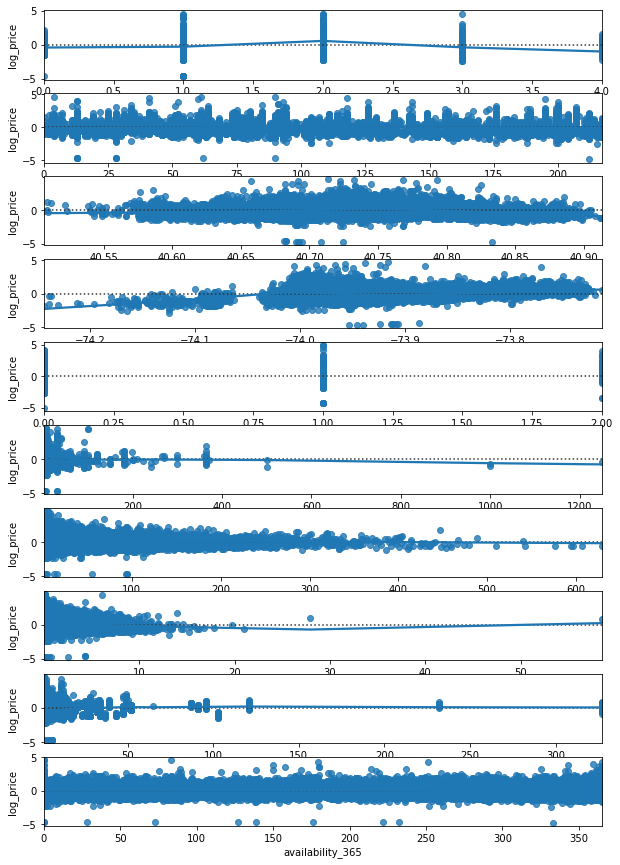

In [27]:
plot, axes = plt.subplots(len(X.columns), 1, figsize=(10, 15))
for i in range(len(X.columns)):
    sns.residplot(X.iloc[:,i],y, lowess=True, ax = axes[i])

# Model Evaluation and Prediction

Scale and split the data into a train and test set. Evaluate varaible importance for feature selection, and use grid search to choose model attributes. Fit and predict using linear and polynomial regression and ridge and lasso regression.

In [15]:
X_scaled = preprocessing.scale(X)

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = .2, random_state = 42)

Evaluating the coefficients to measure feature importance shows that room type and longitude are the most relevant features to the model. None of the coefficients were measured at zero, so all the variables were included in the model.

In [17]:
reg = LinearRegression().fit(X_train, y_train)
importance_reg = reg.coef_
importance_reg

array([ 0.03115872,  0.03702302,  0.0520775 , -0.16078586, -0.39300619,
       -0.03370388, -0.02502641,  0.00639762,  0.00705446,  0.09156169])

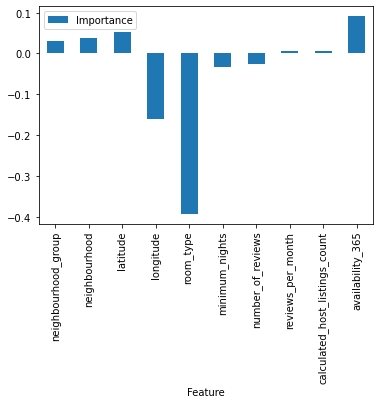

In [18]:
features_reg = pd.concat([pd.Series(X.columns), pd.Series(importance_reg)], axis = 1)
features_reg = features_reg.rename(columns = {0: "Feature", 1: "Importance"})
features_reg.plot.bar(x = "Feature", y = "Importance")

In [19]:
reg = LinearRegression()
parameters = {"fit_intercept":[True, False], "normalize": [True, False]}
reg_grid = GridSearchCV(reg, parameters, cv = 5, scoring = "neg_mean_squared_error")
reg_grid.fit(X_train, y_train)
reg_grid.best_params_

{'fit_intercept': True, 'normalize': True}

In [20]:
lasso = linear_model.Lasso()
ridge = linear_model.Ridge()
parameters = {"alpha": [1, .1, .01, .001, .0001], "normalize": [True, False]}
lasso_grid = GridSearchCV(lasso, parameters, cv = 5, scoring = "neg_mean_squared_error")
ridge_grid = GridSearchCV(ridge, parameters, cv = 5, scoring = "neg_mean_squared_error")

In [21]:
lasso_grid.fit(X_train, y_train)
lasso_grid.best_params_

{'alpha': 0.0001, 'normalize': False}

In [22]:
ridge_grid.fit(X_train, y_train)
ridge_grid.best_params_

{'alpha': 0.001, 'normalize': True}

In [23]:
reg_model = LinearRegression(fit_intercept = True, normalize = True).fit(X_train, y_train)
results = reg_model.predict(X_test)
mean_squared_error(y_test, results)

0.22085423413720395

In [24]:
lasso_model = linear_model.Lasso(alpha = .001, normalize = False).fit(X_train, y_train)
results = lasso_model.predict(X_test)
mean_squared_error(y_test, results)

0.2209535321733128

In [25]:
ridge_model = linear_model.Ridge(alpha = .001, normalize = True).fit(X_train, y_train)
results = ridge_model.predict(X_test)
mean_squared_error(y_test, results)

0.2208628011017

In [30]:
mse = []
for i in range(1, 10):
    polynomial = PolynomialFeatures(i, interaction_only = True)
    polynomial_train = polynomial.fit_transform(X_train)
    polynomial_test = polynomial.fit_transform(X_test)
    poly_model = LinearRegression(fit_intercept = True, normalize = True).fit(polynomial_train, y_train)
    results = poly_model.predict(polynomial_test)
    mse.append(mean_squared_error(y_test, results))

Text(0.5, 1.0, 'MSE by Model Flexibility')

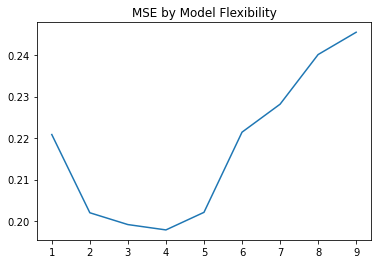

In [33]:
plt.plot(range(1,10), mse)
plt.title("MSE by Model Flexibility")

In [34]:
polynomial = PolynomialFeatures(4, interaction_only = True)
polynomial_train = polynomial.fit_transform(X_train)
polynomial_test = polynomial.fit_transform(X_test)
poly_model = LinearRegression(fit_intercept = True, normalize = True).fit(polynomial_train, y_train)
results = poly_model.predict(polynomial_test)
mean_squared_error(y_test, results)

0.1979034679919396

Since the residual plots revealed the non-linearity of the data, it makes sense to use a polynomial regression function. Evaluating the model at a variety of different flexiblity levels (degree of the polynomial) shows that a degree of 4 results in the lowest test MSE. 